# 2022. 08. 02.

In [ ]:
from mcbj import *
from tqdm.notebook import tqdm
import filter_traces
import plots
import pandas as pd
from matplotlib import rcParams
date = "22_08_02"
sample_rate = 50_000
home_folder = Path(f"D:/BJ_Data/{date}")
import numpy as np
from matplotlib.ticker import MultipleLocator

import utils

# 1-9300 (9300)
## rate=8

In [ ]:
trace_pair = TracePair(1, load_from=home_folder)

In [ ]:
trace_pair.align_trace(align_at=0.5)

In [ ]:
ax = trace_pair.plot_trace_pair(dpi=300, aligned=True)
ax.set_xlim(-0.2, 1)
# ax.set_xlim(94, 98)
ax.axhline(0.5, ls='--', lw=0.5, c='k')
ax.axhline(1e-5, ls='--', lw=0.5, c='k')
# ax.axvline(89.7579574584961)

In [ ]:
import itertools

In [ ]:
vals = []
counts = []
for key, group in itertools.groupby(np.sign(trace_pair.conductance_pull - 1e-5)):
    vals.append(key)
    counts.append(sum(1 for _ in group))

In [ ]:
# print(vals)
# print(counts)

In [ ]:
hist_1 = Histogram(home_folder, start_trace=1, end_trace=9300)

hist_1.calc_stats(align_at=1e-5, range_pull=(-0.4, 0.2), range_push=(-1.5, 0.5), xbins_pull=250, xbins_push=400,
                  plateau_length_bins=100)

In [ ]:
hist_1.hist_2d_push

In [ ]:
ax_temp_pull, ax_temp_push = hist_1.plot_temporal_hist(vmax=100)
ax_temp_pull.set_xticks(np.linspace(start=0, stop=hist_1.temporal_hist_pull.shape[0], num=9, endpoint=True))
ax_temp_pull.set_xticklabels(np.linspace(start=1, stop=hist_1.temporal_hist_pull.shape[0]+1, num=9, endpoint=True))
ax_1d = hist_1.plot_hist_1d(ylims=(0, 60))
ax_pull, ax_push = hist_1.plot_hist_2d_both()

In [ ]:
hist_1.calc_hist_2d(align_at=0.5, range_pull=(-0.2, 0.4), range_push=(-0.5, 1.5),
                    xbins_pull=200, xbins_push=250)

In [ ]:
ax_pull, ax_push = hist_1.plot_hist_2d_both()

# 16301-28950 Temporal Noise
## rate=0.5

In [ ]:
hist_1 = Histogram(home_folder, start_trace=16301, end_trace=28950)

# hist_1.calc_stats(align_at=1e-5, range_pull=(-0.4, 0.2), range_push=(-1.5, 0.5), xbins_pull=250, xbins_push=400,
#                   plateau_length_bins=100)

hist_1.calc_hist_2d(align_at=0.5, range_pull=(-0.1, 0.4), range_push=(-0.5, 1.5),
                    xbins_pull=200, xbins_push=250)

In [ ]:
ax_pull, ax_push = hist_1.plot_hist_2d_both(vmax=1e5)

In [ ]:
hist_1 = Histogram(home_folder, start_trace=16301, end_trace=20300)

# hist_1.calc_stats(align_at=1e-5, range_pull=(-0.4, 0.2), range_push=(-1.5, 0.5), xbins_pull=250, xbins_push=400,
#                   plateau_length_bins=100)

hist_1.calc_hist_2d(align_at=1e-5, range_pull=(-0.4, 0.2), range_push=(-1.5, 0.5),
                    xbins_pull=200, xbins_push=250)

In [ ]:
ax_pull, ax_push = hist_1.plot_hist_2d_both(vmax=1e5)
ax_push.axvline(0, ls='--', lw=0.5, c='k')
ax_push.axvline(-0.8, ls='--', lw=0.5, c='k')
ax_push.axhline(1e-5, ls='--', lw=0.5, c='k')

In [ ]:
print(np.where(abs(trace_pair.aligned_piezo_push + 0.8) < 1e-5))
print(np.where(trace_pair.aligned_piezo_push ==
               min(trace_pair.aligned_piezo_push)))
print(trace_pair.aligned_piezo_push[334799])

In [ ]:
334799-375774

In [ ]:
np.diff(trace_pair.aligned_piezo_push)

In [ ]:
win_size = 1024
step_size = win_size//2
width = 70000

start_trace = 16301
end_trace = 28950+1

noise_power_push = np.zeros((end_trace-start_trace, width//step_size + 2))

for trace in tqdm(range(start_trace, end_trace)):
    # load trace
    trace_pair = TracePair(trace, load_from=home_folder)
    # to study temporal noise of push traces, we align them at 1e-5 G0
    try:
        trace_pair.align_trace(align_at=1e-5)
    except IndexError:
        # trace did not cross align value
        warnings.warn(f'Trace {trace} did not cross align value, skipping trace.')
        continue
    
    cut_part = trace_pair.conductance_push[trace_pair.aligned_piezo_push < 0][:width]
    
    if len(cut_part) < width:
        warnings.warn(f'Trace {trace} was not long enough, skipping trace.')
        continue
    
    cond_avg = utils.mov_avg(cut_part,
                             win_size=win_size, step_size=step_size,
                             avg_type=utils.log_avg)

#     f_push, t_push, Zxx_push = scipy.signal.stft(cut_part,
#                                                  fs=trace_pair.sample_rate,
#                                                  window='hann', nperseg=win_size,
#                                                  noverlap=None,
#                                                  nfft=None, detrend=False, return_onesided=True,
#                                                  boundary='even', padded=True, axis=- 1)
    
    
    f_push, psds_push = scipy.signal.welch(x=psd_intervals, fs=self.sample_rate, window='hann',
                                           nperseg=win_size, noverlap=win_size//2, nfft=None,
                                           detrend=False, scaling='density', average='mean', axis=1)
    

    mask = np.bitwise_and(f_push > 2000, f_push < 5000)
    
    temp_arr = np.array([])

#     for i in range(Zxx_push.shape[1]):
#         psd_push = np.abs(Zxx_push[:, i])
#         temp_arr = np.append(temp_arr, scipy.integrate.trapz(psd_push[mask], x=f_push[mask]))  # g0**2

    for psd_push in psds_push:
        temp_arr = np.append(temp_arr, scipy.integrate.trapz(psd_push[mask], x=f_push[mask]))
    
    if any(np.isnan(temp_arr)):
        warnings.warn(f'Trace {trace} has Nan in noise_power at index: {np.where(np.isnan(temp_arr))}.')
        continue
    else:
        if trace == start_trace:
            noise_power_push = temp_arr
            noise_power_push = noise_power_push.reshape((1, -1))

            cond_avg_push = cond_avg
            cond_avg_push = cond_avg_push.reshape((1, -1))
        else:
            noise_power_push = np.append(noise_power_push, temp_arr.reshape((1, -1)), axis=0)
            cond_avg_push = np.append(cond_avg_push, cond_avg.reshape((1, -1)), axis=0)
    
#     for i in range(Zxx_push.shape[1]):
#         psd_push = np.abs(Zxx_push[:, i])
#         noise_power_push[trace-start_trace, i] = scipy.integrate.trapz(psd_push[mask], x=f_push[mask])  # g0**2
    

In [ ]:
cut_part

In [ ]:
noise_power_push.shape

In [ ]:
cond_avg_push.shape

In [ ]:
t_push*0.5

In [ ]:
N = np.linspace(0, 4, num=1000)
n_push = np.zeros(Zxx_push.shape[1])        

for interval in tqdm(range(Zxx_push.shape[1])):
    push_corr = np.zeros_like(N)
    for i, n in enumerate(N):
        push_corr[i] = utils.calc_correlation(np.log10(noise_power_push[:, interval]/cond_avg_push[:, interval]**n),
                                              np.log10(cond_avg_push[:, interval]))

    n_push[interval] = N[abs(push_corr) == min(abs(push_corr))][0]

In [ ]:
push_corr
n_push

In [ ]:
np.where(np.isnan(noise_power_push[:, 199]))

In [ ]:
n_push.shape

In [ ]:
ax_push = hist_1.plot_hist_2d_one(direction='push', vmax=1e5)
ax_push.axvline(0, ls='--', lw=0.5, c='k')
ax_push.axvline(-0.8, ls='--', lw=0.5, c='k')
ax_push.axhline(1e-5, ls='--', lw=0.5, c='k')
ax_push.set_xlim(0.5, -1.5)
parx = ax_push.twinx()
parx.plot(-0.5*t_push, n_push, lw=1)

In [ ]:
trace_pair.aligned_piezo_push[trace_pair.aligned_piezo_push < 0][80000]

In [ ]:
c = 0
for trace in range(16301, 28950+1):
    c+=1
    
print(c)
print(28950+1-16301)

In [ ]:
trace_pair.align_trace(align_at=1e-5)
trace_pair.conductance_push[trace_pair.aligned_piezo_push < 0][:41000]

In [ ]:
win_size = 512
step_size = win_size//2

f_push, t_push, Zxx_push = scipy.signal.stft(trace_pair.conductance_push[trace_pair.aligned_piezo_push > 0][:41000],
                                                 fs=trace_pair.sample_rate,
                                                 window='hann', nperseg=win_size,
                                                 noverlap=win_size - step_size,
                                                 nfft=None, detrend=False, return_onesided=True,
                                                 boundary='even', padded=True, axis=- 1)

In [ ]:
Zxx_push.shape

In [ ]:
trace_pair.aligned_piezo_push[trace_pair.aligned_piezo_push < 0][95000]

In [ ]:
count = 16301

In [ ]:
# count += 1
trace_pair = TracePair(16301+11580, load_from=home_folder)
trace_pair.temporal_noise(align_at=0.5, mode='whole',
                          win_size=512)
ax_pull, ax_push = trace_pair.plot_temporal_noise(mode='whole', normalize=True,
                                                  add_vlines=(0, 0),
                                                  add_hlines=(0.5, 1e-5)#,
#                                                   piezo_range_pull=(-0.25, 0.25),
#                                                   piezo_range_push=(1, -0.5)
                                                 )
# ax_push.axhline(3000, lw=0.5, color='blue', ls='--')
# ax_push.axhline(3500, lw=0.5, color='blue', ls='--')
# ax_push.axvline(-0.15, lw=0.5, color='k', ls='-')
ax_push.set_xlim(1.5, 0)

In [ ]:
trace_pair.aligned_piezo_push[np.isinf(trace_pair.conductance_push)]

In [ ]:
len(trace_pair.aligned_piezo_pull[trace_pair.aligned_piezo_pull>0])

In [ ]:
print(np.where(abs(trace_pair.aligned_piezo_pull) == min(abs(trace_pair.aligned_piezo_pull))))

In [ ]:
print(len(trace_pair.aligned_piezo_pull))
print((len(trace_pair.aligned_piezo_pull)-start_index)%512)
print(start_index%512)

In [ ]:
start_index = np.where(abs(trace_pair.aligned_piezo_pull) == min(abs(trace_pair.aligned_piezo_pull)))[0][0]
print(start_index)

In [ ]:
freq_range = (2000, 5000)
for i in range(trace_pair.Zxx_pull.shape[1]):   
    mask = np.bitwise_and(trace_pair.f_pull > freq_range[0], trace_pair.f_pull < freq_range[1])
    noise_power_pull[i] = scipy.integrate.trapz(trace_pair.Zxx_pull[:, i][mask],
                                                x=trace_pair.f_pull[mask])
    
    N = np.linspace(0, 4, num=1000)
    

In [ ]:
print(trace_pair.Zxx_pull[:, 0].shape)
print(trace_pair.f_pull.shape)
print(trace_pair.t_pull.shape)

In [290]:
win_size = 1024
step_size = win_size//2
width = 70000

start_trace = 16301
end_trace = 28950+1

noise_power_push = np.zeros((end_trace-start_trace, width//step_size + 2))

for trace in tqdm(range(start_trace, end_trace)):
    # load trace
    trace_pair = TracePair(trace, load_from=home_folder)
    # to study temporal noise of push traces, we align them at 1e-5 G0
    try:
        trace_pair.align_trace(align_at=1e-5)
    except IndexError:
        # trace did not cross align value
        warnings.warn(f'Trace {trace} did not cross align value, skipping trace.')
        continue
    
    cut_part = trace_pair.conductance_push[trace_pair.aligned_piezo_push < 0][:width]
    
    if len(cut_part) < width:
        warnings.warn(f'Trace {trace} was not long enough, skipping trace.')
        continue
    
    cond_avg = utils.mov_avg(cut_part,
                             win_size=win_size, step_size=step_size,
                             avg_type=utils.log_avg)

#     f_push, t_push, Zxx_push = scipy.signal.stft(cut_part,
#                                                  fs=trace_pair.sample_rate,
#                                                  window='hann', nperseg=win_size,
#                                                  noverlap=None,
#                                                  nfft=None, detrend=False, return_onesided=True,
#                                                  boundary='even', padded=True, axis=- 1)
    
    
    f_push, psds_push = scipy.signal.welch(x=psd_intervals, fs=self.sample_rate, window='hann',
                                           nperseg=win_size, noverlap=win_size//2, nfft=None,
                                           detrend=False, scaling='density', average='mean', axis=1)
    

    mask = np.bitwise_and(f_push > 2000, f_push < 5000)
    
    temp_arr = np.array([])

#     for i in range(Zxx_push.shape[1]):
#         psd_push = np.abs(Zxx_push[:, i])
#         temp_arr = np.append(temp_arr, scipy.integrate.trapz(psd_push[mask], x=f_push[mask]))  # g0**2

    for psd_push in psds_push:
        temp_arr = np.append(temp_arr, scipy.integrate.trapz(psd_push[mask], x=f_push[mask]))
    
    if any(np.isnan(temp_arr)):
        warnings.warn(f'Trace {trace} has Nan in noise_power at index: {np.where(np.isnan(temp_arr))}.')
        continue
    else:
        if trace == start_trace:
            noise_power_push = temp_arr
            noise_power_push = noise_power_push.reshape((1, -1))

            cond_avg_push = cond_avg
            cond_avg_push = cond_avg_push.reshape((1, -1))
        else:
            noise_power_push = np.append(noise_power_push, temp_arr.reshape((1, -1)), axis=0)
            cond_avg_push = np.append(cond_avg_push, cond_avg.reshape((1, -1)), axis=0)
    
#     for i in range(Zxx_push.shape[1]):
#         psd_push = np.abs(Zxx_push[:, i])
#         noise_power_push[trace-start_trace, i] = scipy.integrate.trapz(psd_push[mask], x=f_push[mask])  # g0**2
    

  0%|          | 0/12650 [00:00<?, ?it/s]

D:\Greta\mcbj_stm-bj\utils.py:863: RuntimeWarning: divide by zero encountered in double_scalars
  return ind1[0] + (y-ind1[1])*(ind2[0]-ind1[0])/(ind2[1]-ind1[1])
C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:24: UserWarning: Trace 16394 was not long enough, skipping trace.
  warnings.warn(f'Trace {trace} was not long enough, skipping trace.')
C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:24: UserWarning: Trace 19852 was not long enough, skipping trace.
  warnings.warn(f'Trace {trace} was not long enough, skipping trace.')
C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:24: UserWarning: Trace 21972 was not long enough, skipping trace.
  warnings.warn(f'Trace {trace} was not long enough, skipping trace.')
C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:24: UserWarning: Trace 22781 was not long enough, skipping trace.
  warnings.warn(f'Trace {trace} was not long enough, skipping trace.')
D:\Greta\mcbj_stm-bj\venv

C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:47: UserWarning: Trace 23462 has Nan in noise_power at index: (array([122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134,
       135, 136, 137], dtype=int64),).
  warnings.warn(f'Trace {trace} has Nan in noise_power at index: {np.where(np.isnan(temp_arr))}.')
C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:47: UserWarning: Trace 23484 has Nan in noise_power at index: (array([125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137],
      dtype=int64),).
  warnings.warn(f'Trace {trace} has Nan in noise_power at index: {np.where(np.isnan(temp_arr))}.')
C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:47: UserWarning: Trace 23490 has Nan in noise_power at index: (array([135, 136, 137], dtype=int64),).
  warnings.warn(f'Trace {trace} has Nan in noise_power at index: {np.where(np.isnan(temp_arr))}.')
C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:47: U

C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:47: UserWarning: Trace 25442 has Nan in noise_power at index: (array([136, 137], dtype=int64),).
  warnings.warn(f'Trace {trace} has Nan in noise_power at index: {np.where(np.isnan(temp_arr))}.')
C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:47: UserWarning: Trace 25497 has Nan in noise_power at index: (array([134, 135, 136], dtype=int64),).
  warnings.warn(f'Trace {trace} has Nan in noise_power at index: {np.where(np.isnan(temp_arr))}.')
C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:47: UserWarning: Trace 25544 has Nan in noise_power at index: (array([134, 135, 136, 137], dtype=int64),).
  warnings.warn(f'Trace {trace} has Nan in noise_power at index: {np.where(np.isnan(temp_arr))}.')
C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:47: UserWarning: Trace 25545 has Nan in noise_power at index: (array([125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137

C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:47: UserWarning: Trace 26067 has Nan in noise_power at index: (array([131, 132, 133, 134, 135, 136, 137], dtype=int64),).
  warnings.warn(f'Trace {trace} has Nan in noise_power at index: {np.where(np.isnan(temp_arr))}.')
C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:47: UserWarning: Trace 26138 has Nan in noise_power at index: (array([136, 137], dtype=int64),).
  warnings.warn(f'Trace {trace} has Nan in noise_power at index: {np.where(np.isnan(temp_arr))}.')
C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:47: UserWarning: Trace 26165 has Nan in noise_power at index: (array([132, 133, 134, 135, 136, 137], dtype=int64),).
  warnings.warn(f'Trace {trace} has Nan in noise_power at index: {np.where(np.isnan(temp_arr))}.')
C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:47: UserWarning: Trace 26169 has Nan in noise_power at index: (array([130, 131, 132, 133, 134, 135, 136

C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:47: UserWarning: Trace 27457 has Nan in noise_power at index: (array([133, 134, 135, 136, 137], dtype=int64),).
  warnings.warn(f'Trace {trace} has Nan in noise_power at index: {np.where(np.isnan(temp_arr))}.')
C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:47: UserWarning: Trace 27591 has Nan in noise_power at index: (array([133, 134, 135, 136, 137], dtype=int64),).
  warnings.warn(f'Trace {trace} has Nan in noise_power at index: {np.where(np.isnan(temp_arr))}.')
C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:47: UserWarning: Trace 27648 has Nan in noise_power at index: (array([127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137], dtype=int64),).
  warnings.warn(f'Trace {trace} has Nan in noise_power at index: {np.where(np.isnan(temp_arr))}.')
C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:47: UserWarning: Trace 27787 has Nan in noise_power at index: (array([135

C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:47: UserWarning: Trace 28231 has Nan in noise_power at index: (array([133, 134, 135, 136], dtype=int64),).
  warnings.warn(f'Trace {trace} has Nan in noise_power at index: {np.where(np.isnan(temp_arr))}.')
C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:47: UserWarning: Trace 28241 has Nan in noise_power at index: (array([133, 134, 135, 136, 137], dtype=int64),).
  warnings.warn(f'Trace {trace} has Nan in noise_power at index: {np.where(np.isnan(temp_arr))}.')
C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:47: UserWarning: Trace 28737 has Nan in noise_power at index: (array([127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137], dtype=int64),).
  warnings.warn(f'Trace {trace} has Nan in noise_power at index: {np.where(np.isnan(temp_arr))}.')
C:\Users\ANDRS~1\AppData\Local\Temp/ipykernel_14032/2541854265.py:47: UserWarning: Trace 28813 has Nan in noise_power at index: (array([116, 117

In [291]:
cut_part

array([9.5611713e-06, 1.8013798e-05, 2.3034221e-05, ..., 3.4921258e-04,
       3.4239833e-04, 3.3391552e-04], dtype=float32)

In [299]:
noise_power_push.shape

(12499, 138)

In [293]:
cond_avg_push.shape

(12499, 138)

In [294]:
t_push*0.5

array([0.     , 0.00512, 0.01024, 0.01536, 0.02048, 0.0256 , 0.03072,
       0.03584, 0.04096, 0.04608, 0.0512 , 0.05632, 0.06144, 0.06656,
       0.07168, 0.0768 , 0.08192, 0.08704, 0.09216, 0.09728, 0.1024 ,
       0.10752, 0.11264, 0.11776, 0.12288, 0.128  , 0.13312, 0.13824,
       0.14336, 0.14848, 0.1536 , 0.15872, 0.16384, 0.16896, 0.17408,
       0.1792 , 0.18432, 0.18944, 0.19456, 0.19968, 0.2048 , 0.20992,
       0.21504, 0.22016, 0.22528, 0.2304 , 0.23552, 0.24064, 0.24576,
       0.25088, 0.256  , 0.26112, 0.26624, 0.27136, 0.27648, 0.2816 ,
       0.28672, 0.29184, 0.29696, 0.30208, 0.3072 , 0.31232, 0.31744,
       0.32256, 0.32768, 0.3328 , 0.33792, 0.34304, 0.34816, 0.35328,
       0.3584 , 0.36352, 0.36864, 0.37376, 0.37888, 0.384  , 0.38912,
       0.39424, 0.39936, 0.40448, 0.4096 , 0.41472, 0.41984, 0.42496,
       0.43008, 0.4352 , 0.44032, 0.44544, 0.45056, 0.45568, 0.4608 ,
       0.46592, 0.47104, 0.47616, 0.48128, 0.4864 , 0.49152, 0.49664,
       0.50176, 0.50

In [295]:
N = np.linspace(0, 4, num=1000)
n_push = np.zeros(Zxx_push.shape[1])        

for interval in tqdm(range(Zxx_push.shape[1])):
    push_corr = np.zeros_like(N)
    for i, n in enumerate(N):
        push_corr[i] = utils.calc_correlation(np.log10(noise_power_push[:, interval]/cond_avg_push[:, interval]**n),
                                              np.log10(cond_avg_push[:, interval]))

    n_push[interval] = N[abs(push_corr) == min(abs(push_corr))][0]

  0%|          | 0/138 [00:00<?, ?it/s]

In [296]:
push_corr
n_push

array([1.38938939, 1.31731732, 1.22122122, 1.18118118, 1.18118118,
       1.16516517, 1.14914915, 1.13713714, 1.14114114, 1.12112112,
       1.10910911, 1.10510511, 1.1011011 , 1.11311311, 1.0970971 ,
       1.08908909, 1.08508509, 1.08108108, 1.08108108, 1.06506507,
       1.07307307, 1.05705706, 1.05705706, 1.05705706, 1.05305305,
       1.04904905, 1.04104104, 1.04504505, 1.04104104, 1.04504505,
       1.04104104, 1.04104104, 1.04104104, 1.03703704, 1.03703704,
       1.04104104, 1.03303303, 1.02502503, 1.03303303, 1.03303303,
       1.02902903, 1.03303303, 1.03303303, 1.02902903, 1.02902903,
       1.03703704, 1.03703704, 1.03703704, 1.03703704, 1.03703704,
       1.03703704, 1.04104104, 1.04504505, 1.04504505, 1.04504505,
       1.04504505, 1.05305305, 1.05305305, 1.05705706, 1.05705706,
       1.05705706, 1.06106106, 1.06106106, 1.06106106, 1.06906907,
       1.06906907, 1.07307307, 1.08108108, 1.08108108, 1.08908909,
       1.09309309, 1.0970971 , 1.08908909, 1.0970971 , 1.09709

In [276]:
np.where(np.isnan(noise_power_push[:, 199]))

(array([11581], dtype=int64),)

In [251]:
n_push.shape

(314,)

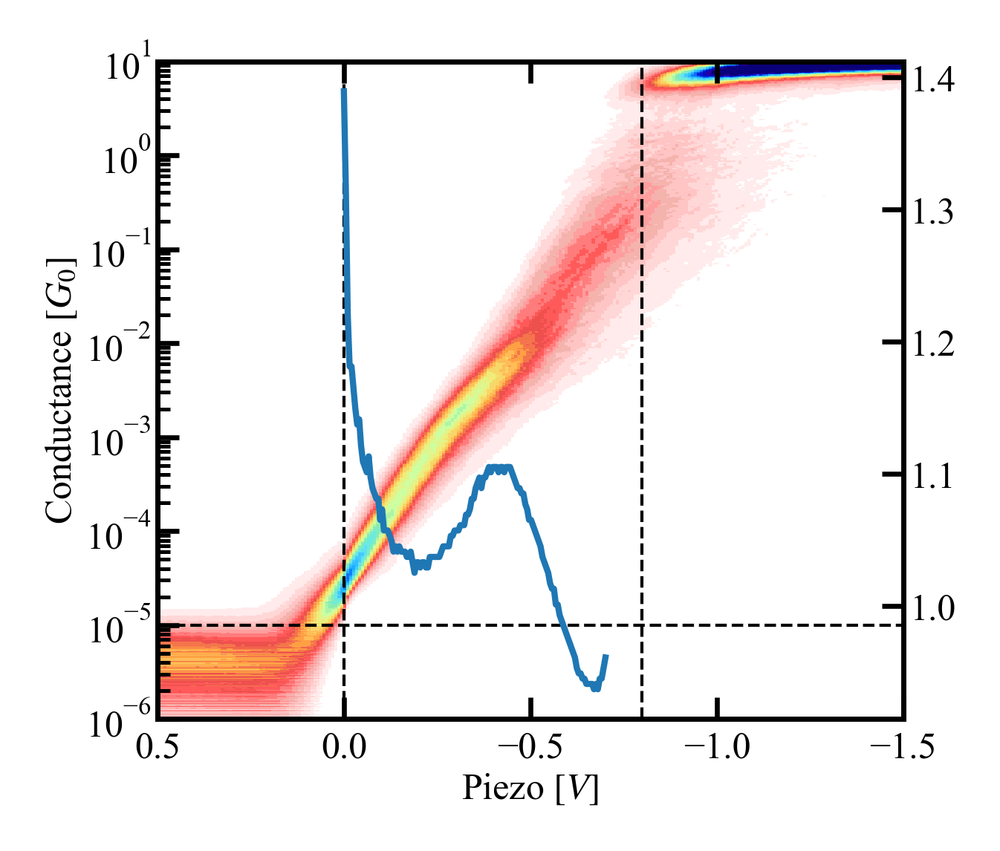

In [301]:
ax_push = hist_1.plot_hist_2d_one(direction='push', vmax=1e5)
ax_push.axvline(0, ls='--', lw=0.5, c='k')
ax_push.axvline(-0.8, ls='--', lw=0.5, c='k')
ax_push.axhline(1e-5, ls='--', lw=0.5, c='k')
ax_push.set_xlim(0.5, -1.5)
parx = ax_push.twinx()
parx.plot(-0.5*t_push, n_push, lw=1)

In [244]:
trace_pair.aligned_piezo_push[trace_pair.aligned_piezo_push < 0][80000]

-0.8046469480067628

In [217]:
c = 0
for trace in range(16301, 28950+1):
    c+=1
    
print(c)
print(28950+1-16301)

12650
12650


In [61]:
trace_pair.align_trace(align_at=1e-5)
trace_pair.conductance_push[trace_pair.aligned_piezo_push < 0][:41000]

array([8.3924087e-06, 1.6131238e-05, 1.6857186e-05, ..., 4.7371984e-03,
       4.8512877e-03, 5.0119669e-03], dtype=float32)

In [65]:
win_size = 512
step_size = win_size//2

f_push, t_push, Zxx_push = scipy.signal.stft(trace_pair.conductance_push[trace_pair.aligned_piezo_push > 0][:41000],
                                                 fs=trace_pair.sample_rate,
                                                 window='hann', nperseg=win_size,
                                                 noverlap=win_size - step_size,
                                                 nfft=None, detrend=False, return_onesided=True,
                                                 boundary='even', padded=True, axis=- 1)

In [66]:
Zxx_push.shape

(257, 162)

160

In [60]:
trace_pair.aligned_piezo_push[trace_pair.aligned_piezo_push < 0][95000]

-0.9555077297082306

In [2]:
count = 16301

D:\Greta\mcbj_stm-bj\venv\lib\site-packages\scipy\signal\spectral.py:1911: RuntimeWarning: invalid value encountered in multiply
  result = win * result
D:\Greta\mcbj_stm-bj\venv\lib\site-packages\scipy\signal\spectral.py:1844: RuntimeWarning: invalid value encountered in multiply
  result *= scale
D:\Greta\mcbj_stm-bj\mcbj.py:827: RuntimeWarning: invalid value encountered in true_divide
  pcm_pull = ax_pull.pcolormesh(self.t_pull + shift_pull, self.f_pull,
D:\Greta\mcbj_stm-bj\mcbj.py:832: RuntimeWarning: invalid value encountered in true_divide
  pcm_push = ax_push.pcolormesh(self.t_push[::-1] + shift_push, self.f_push,


(1.5, 0.0)

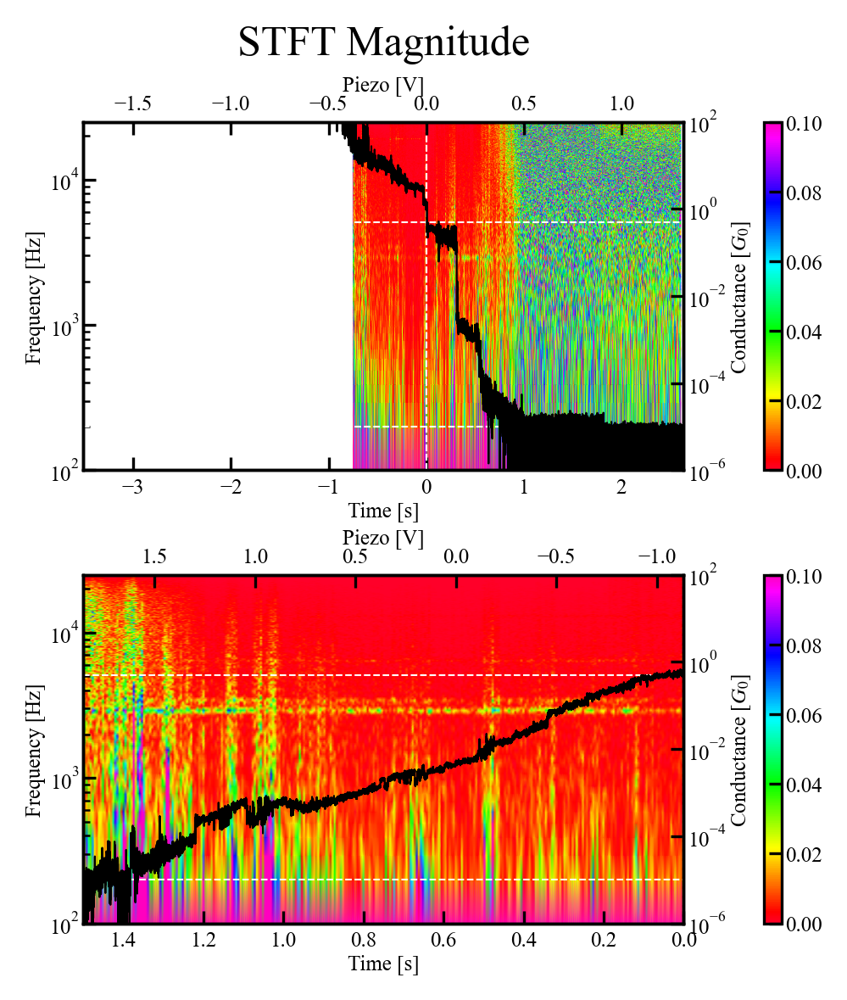

In [282]:
# count += 1
trace_pair = TracePair(16301+11580, load_from=home_folder)
trace_pair.temporal_noise(align_at=0.5, mode='whole',
                          win_size=512)
ax_pull, ax_push = trace_pair.plot_temporal_noise(mode='whole', normalize=True,
                                                  add_vlines=(0, 0),
                                                  add_hlines=(0.5, 1e-5)#,
#                                                   piezo_range_pull=(-0.25, 0.25),
#                                                   piezo_range_push=(1, -0.5)
                                                 )
# ax_push.axhline(3000, lw=0.5, color='blue', ls='--')
# ax_push.axhline(3500, lw=0.5, color='blue', ls='--')
# ax_push.axvline(-0.15, lw=0.5, color='k', ls='-')
ax_push.set_xlim(1.5, 0)

In [82]:
trace_pair.aligned_piezo_push[np.isinf(trace_pair.conductance_push)]

array([-0.15041012, -0.15277382, -0.152804  , ..., -1.11682362,
       -1.11683368, -1.11684374])

In [17]:
len(trace_pair.aligned_piezo_pull[trace_pair.aligned_piezo_pull>0])

107610

In [10]:
print(np.where(abs(trace_pair.aligned_piezo_pull) == min(abs(trace_pair.aligned_piezo_pull))))

(array([243774], dtype=int64),)


In [14]:
print(len(trace_pair.aligned_piezo_pull))
print((len(trace_pair.aligned_piezo_pull)-start_index)%512)
print(start_index%512)

349515
269
62


In [9]:
start_index = np.where(abs(trace_pair.aligned_piezo_pull) == min(abs(trace_pair.aligned_piezo_pull)))[0][0]
print(start_index)

243774


In [ ]:
freq_range = (2000, 5000)
for i in range(trace_pair.Zxx_pull.shape[1]):   
    mask = np.bitwise_and(trace_pair.f_pull > freq_range[0], trace_pair.f_pull < freq_range[1])
    noise_power_pull[i] = scipy.integrate.trapz(trace_pair.Zxx_pull[:, i][mask],
                                                x=trace_pair.f_pull[mask])
    
    N = np.linspace(0, 4, num=1000)
    

In [18]:
print(trace_pair.Zxx_pull[:, 0].shape)
print(trace_pair.f_pull.shape)
print(trace_pair.t_pull.shape)

(257,)
(257,)
(1452,)


# 28951-40400 (11450)
## rate=4

In [14]:
hist_2 = Histogram(home_folder, start_trace=28951, end_trace=40400)

hist_2.calc_stats(align_at=1e-5, range_pull=(-0.4, 0.2), range_push=(-1.5, 0.5), xbins_pull=250, xbins_push=400,
                  plateau_length_bins=100)

Processing break junction files:   0%|          | 0/116 [00:00<?, ?it/s]

D:\Greta\mcbj_stm-bj\utils.py:863: RuntimeWarning: divide by zero encountered in double_scalars
  return ind1[0] + (y-ind1[1])*(ind2[0]-ind1[0])/(ind2[1]-ind1[1])
D:\Greta\mcbj_stm-bj\mcbj.py:1730: UserWarning: Trace did not cross align value 1e-05. Skipping trace pair 36873
  warnings.warn(f'Trace did not cross align value {align_at}. '
D:\Greta\mcbj_stm-bj\mcbj.py:1730: UserWarning: Trace did not cross align value 1e-05. Skipping trace pair 36912
  warnings.warn(f'Trace did not cross align value {align_at}. '
D:\Greta\mcbj_stm-bj\mcbj.py:1730: UserWarning: Trace did not cross align value 1e-05. Skipping trace pair 36915
  warnings.warn(f'Trace did not cross align value {align_at}. '
D:\Greta\mcbj_stm-bj\mcbj.py:1730: UserWarning: Trace did not cross align value 1e-05. Skipping trace pair 36916
  warnings.warn(f'Trace did not cross align value {align_at}. '
D:\Greta\mcbj_stm-bj\mcbj.py:1730: UserWarning: Trace did not cross align value 1e-05. Skipping trace pair 36934
  warnings.warn(

Pull 2D histogram created from 11441 traces
Push 2D histogram created from 11441 traces


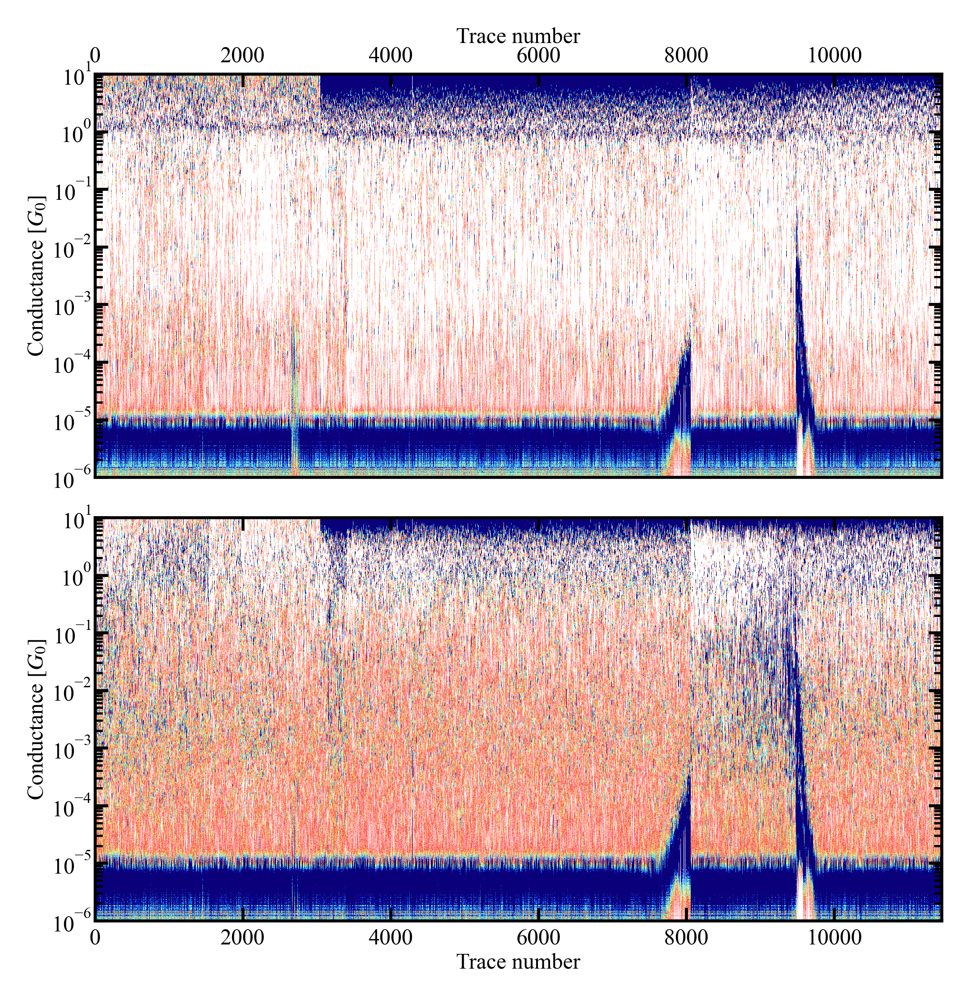

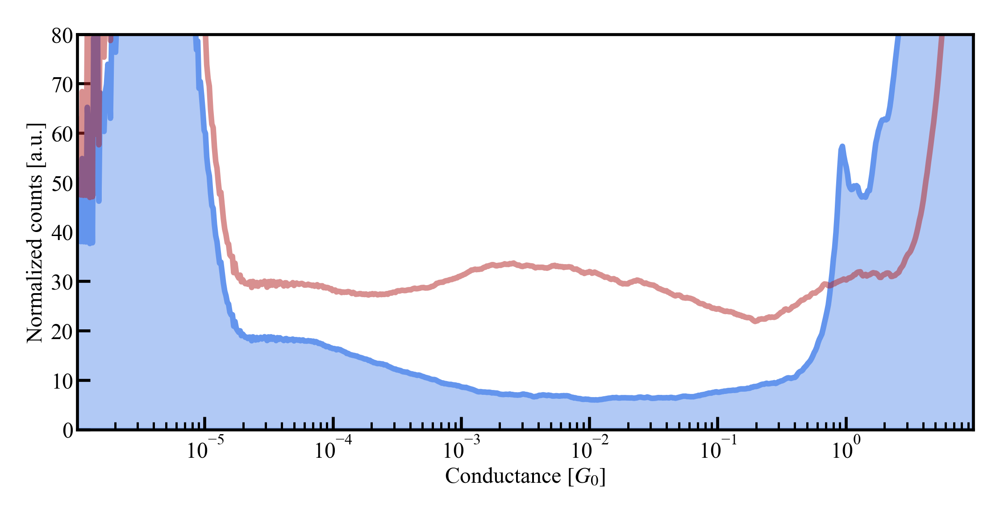

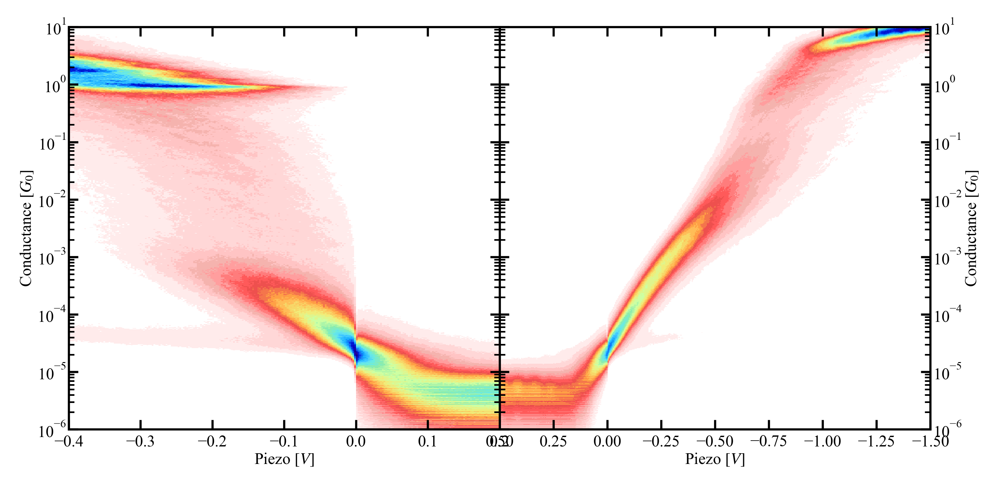

In [15]:
ax_temp_pull, ax_temp_push = hist_2.plot_temporal_hist(vmax=100)
# ax_temp_pull.set_xticks(np.linspace(start=0, stop=hist_2.temporal_hist_pull.shape[0], num=9, endpoint=True))
# ax_temp_pull.set_xticklabels(np.linspace(start=1, stop=hist_2.temporal_hist_pull.shape[0]+1, num=9, endpoint=True))
ax_1d = hist_2.plot_hist_1d(ylims=(0, 80))
ax_pull, ax_push = hist_2.plot_hist_2d_both()

In [16]:
hist_2.calc_hist_2d(align_at=0.5, range_pull=(-0.2, 0.4), range_push=(-0.5, 1.5),
                    xbins_pull=200, xbins_push=250)

Calculating 2D conductance-displacement histograms:   0%|          | 0/116 [00:00<?, ?it/s]

2D histogram pull direction created from 11450 traces
2D histogram push direction created from 11450 traces


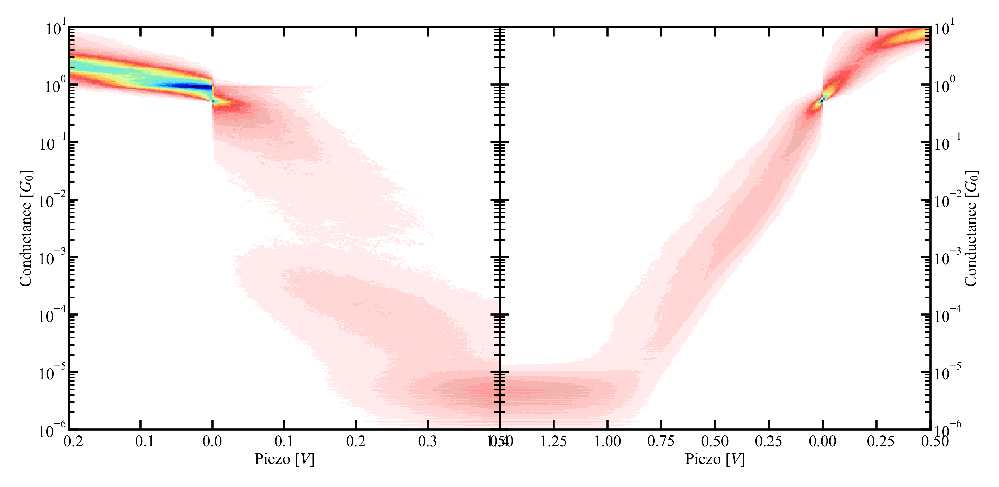

In [17]:
ax_pull, ax_push = hist_2.plot_hist_2d_both()

# 43701-47600 (3900)
## rate=4

In [18]:
hist_3 = Histogram(home_folder, start_trace=43701, end_trace=47600)

hist_3.calc_stats(align_at=1e-5, range_pull=(-0.4, 0.2), range_push=(-1.5, 0.5), xbins_pull=250, xbins_push=400,
                  plateau_length_bins=100)

Processing break junction files:   0%|          | 0/40 [00:00<?, ?it/s]

D:\Greta\mcbj_stm-bj\utils.py:863: RuntimeWarning: divide by zero encountered in double_scalars
  return ind1[0] + (y-ind1[1])*(ind2[0]-ind1[0])/(ind2[1]-ind1[1])


Pull 2D histogram created from 3900 traces
Push 2D histogram created from 3900 traces


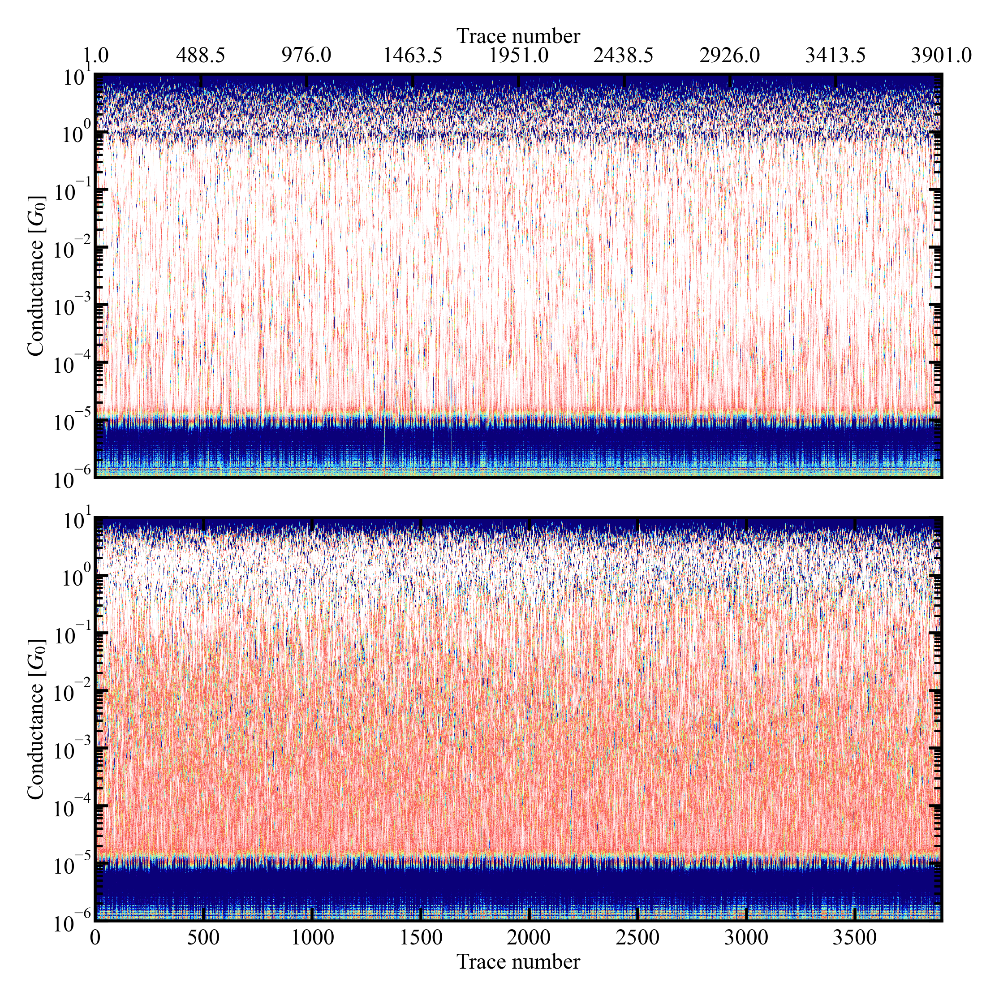

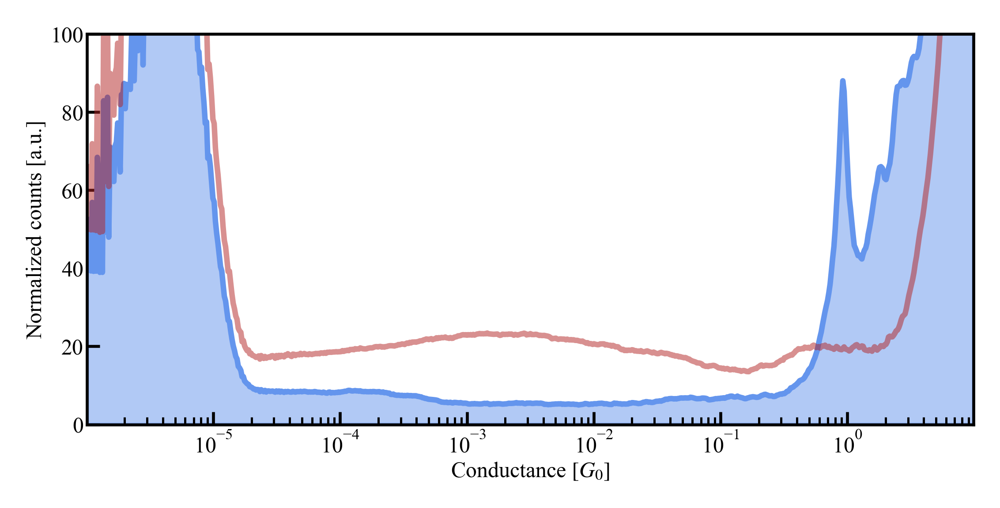

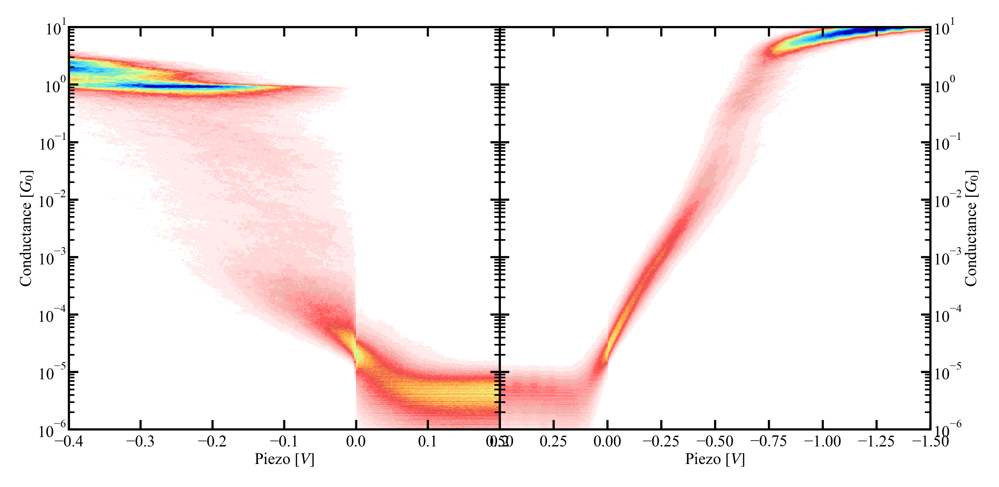

In [19]:
ax_temp_pull, ax_temp_push = hist_3.plot_temporal_hist(vmax=100)
ax_temp_pull.set_xticks(np.linspace(start=0, stop=hist_3.temporal_hist_pull.shape[0], num=9, endpoint=True))
ax_temp_pull.set_xticklabels(np.linspace(start=1, stop=hist_3.temporal_hist_pull.shape[0]+1, num=9, endpoint=True))
ax_1d = hist_3.plot_hist_1d(ylims=(0, 100))
ax_pull, ax_push = hist_3.plot_hist_2d_both()

In [20]:
hist_3.calc_hist_2d(align_at=0.5, range_pull=(-0.2, 0.4), range_push=(-0.5, 1.5),
                    xbins_pull=200, xbins_push=250)

Calculating 2D conductance-displacement histograms:   0%|          | 0/40 [00:00<?, ?it/s]

2D histogram pull direction created from 3900 traces
2D histogram push direction created from 3900 traces


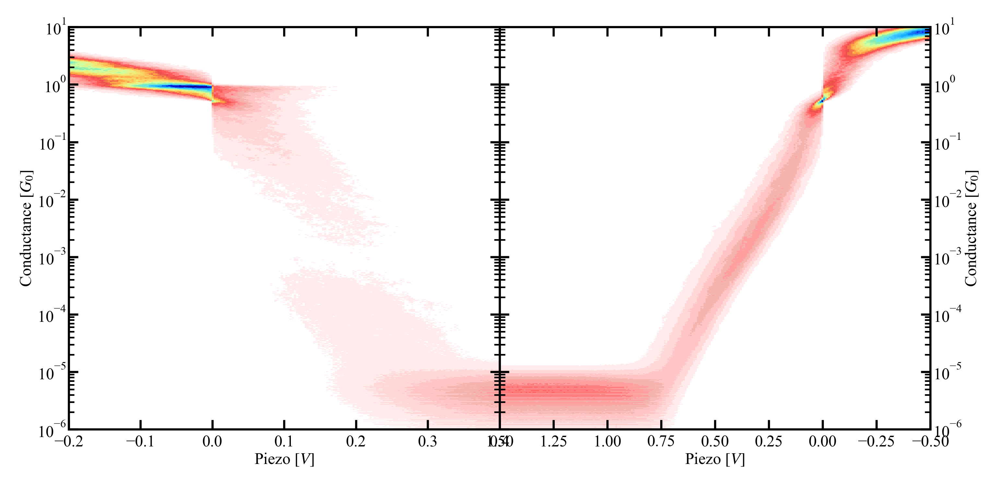

In [21]:
ax_pull, ax_push = hist_3.plot_hist_2d_both()

# 51601-58200 (6600)
## rate=4

In [22]:
hist_4 = Histogram(home_folder, start_trace=51601, end_trace=58200)

hist_4.calc_stats(align_at=1e-5, range_pull=(-0.6, 0.55), range_push=(-2, 1), xbins_pull=250, xbins_push=400,
                  plateau_length_bins=100)

Processing break junction files:   0%|          | 0/67 [00:00<?, ?it/s]

D:\Greta\mcbj_stm-bj\utils.py:863: RuntimeWarning: divide by zero encountered in double_scalars
  return ind1[0] + (y-ind1[1])*(ind2[0]-ind1[0])/(ind2[1]-ind1[1])


Pull 2D histogram created from 6600 traces
Push 2D histogram created from 6600 traces


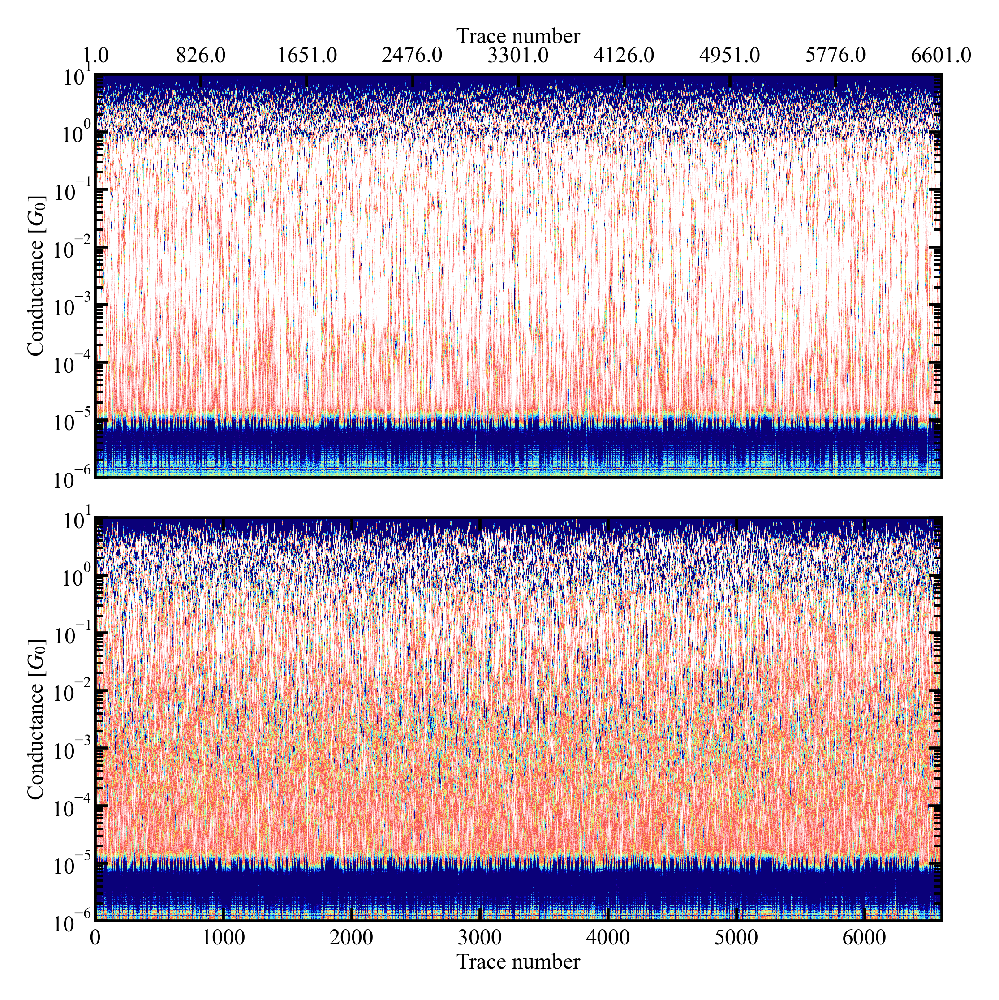

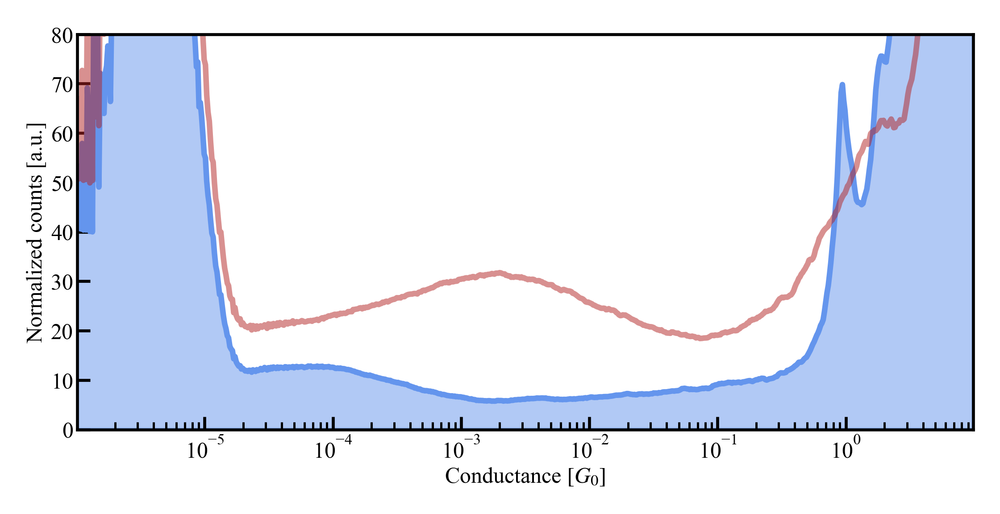

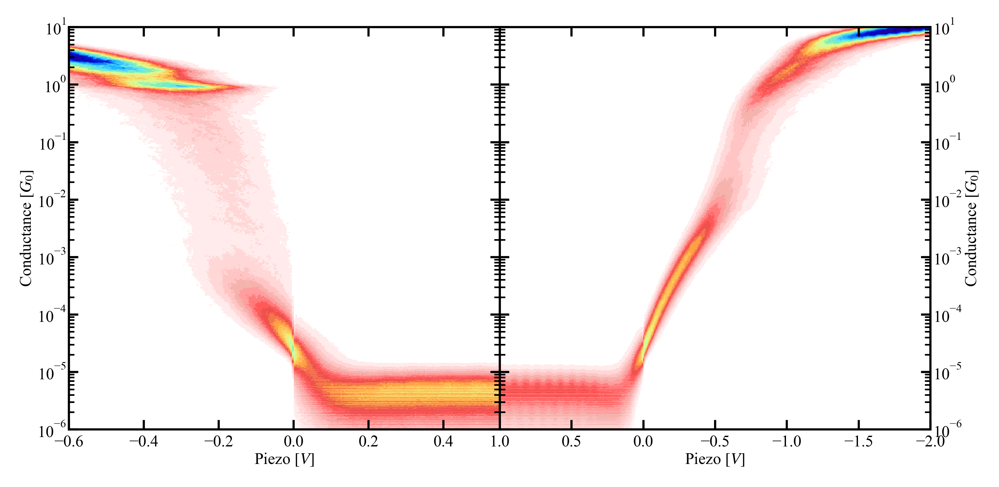

In [23]:
ax_temp_pull, ax_temp_push = hist_4.plot_temporal_hist(vmax=100)
ax_temp_pull.set_xticks(np.linspace(start=0, stop=hist_4.temporal_hist_pull.shape[0], num=9, endpoint=True))
ax_temp_pull.set_xticklabels(np.linspace(start=1, stop=hist_4.temporal_hist_pull.shape[0]+1, num=9, endpoint=True))
ax_1d = hist_4.plot_hist_1d(ylims=(0, 80))
ax_pull, ax_push = hist_4.plot_hist_2d_both()

In [24]:
hist_4.calc_hist_2d(align_at=0.5, range_pull=(-0.2, 0.4), range_push=(-0.5, 1.5),
                    xbins_pull=200, xbins_push=250)

Calculating 2D conductance-displacement histograms:   0%|          | 0/67 [00:00<?, ?it/s]

2D histogram pull direction created from 6600 traces
2D histogram push direction created from 6600 traces


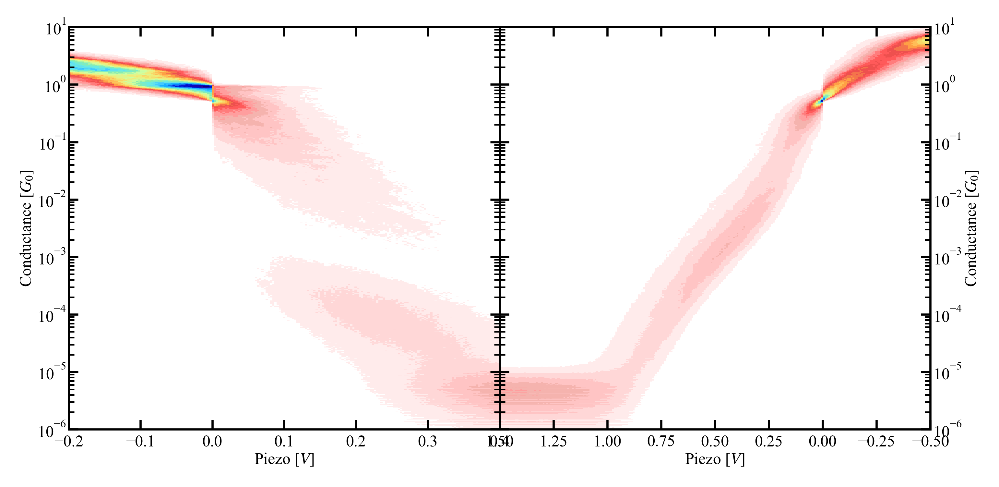

In [25]:
ax_pull, ax_push = hist_4.plot_hist_2d_both()